# Text2Image Demo

This notebook shows some example queries issued to text2image search system. It showcases both, queries that perform well and those which don't.

In [1]:
import sys
sys.path.append('../../') #  this is necessary so that you can run notebook from docker
from pathlib import Path

import numpy as np
from PIL import Image

from backend.config import AppSettings
from backend.semanticsearch import _is_image_file, setup_demo

%reload_ext autoreload
%autoreload 2

## Data Exploration

In [2]:
DATA_DIR = AppSettings.IMAGE_DATA_PATH

In [3]:
# total images we have

files = [i for i in Path(DATA_DIR).iterdir() if i.is_file()]
img_files = [i for i in files if _is_image_file(i)]

print(f'# files: {len(files)}')
print(f'# image files: {len(img_files)}')

print('\nFile extensions:')
print(set(i.suffix for i in files))

# files: 11107
# image files: 11106

File extensions:
{'.jpg', ''}


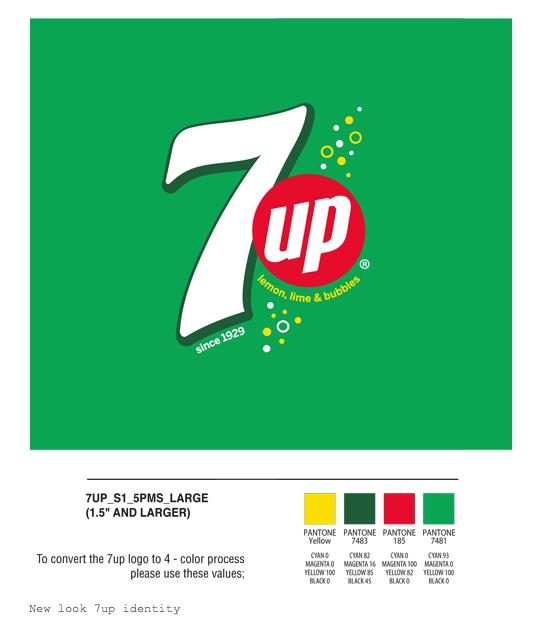

In [4]:
# print sample image

sample_image = DATA_DIR + '/70.jpg'
image = Image.open(sample_image)
image

Shapes: (515, 334) (515, 334, 3)


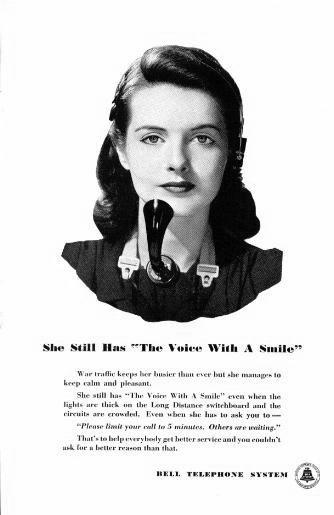

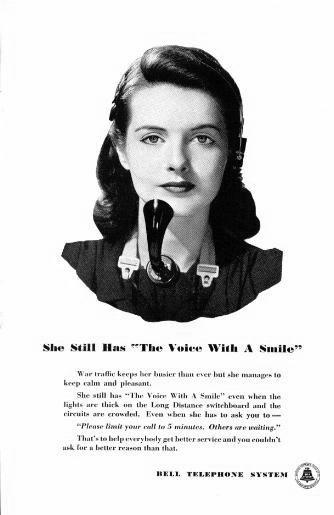

In [5]:
# Some images happen to be grayscale. For those, I simply copy gray channel to ll 3 RGB channels, see below.

gray_img = Image.open(DATA_DIR + '/111711.jpg')
gray_img_interp = np.repeat(np.array(gray_img)[..., np.newaxis], 3, -1)

print('Shapes:', np.array(gray_img).shape, gray_img_interp.shape)
display(gray_img)
display(Image.fromarray(gray_img_interp))

## Demo Queries

In [ ]:
# here we call script that creates demo collection and pre-populates it with images for our demo purposes. If collection already exist it does nothing.

collection_name, seaerch_client = setup_demo()

In [7]:
# sanity check that all images have been successfully indexed

_index_status = seaerch_client.qdrant.get_collection(collection_name)
_index_status.status, _index_status.points_count

HTTP Request: GET http://localhost:6333/collections/demo_collection "HTTP/1.1 200 OK"


(<CollectionStatus.GREEN: 'green'>, 11106)

HTTP Request: GET http://localhost:6333/collections/demo_collection "HTTP/1.1 200 OK"
HTTP Request: POST http://localhost:6333/collections/demo_collection/points/search "HTTP/1.1 200 OK"


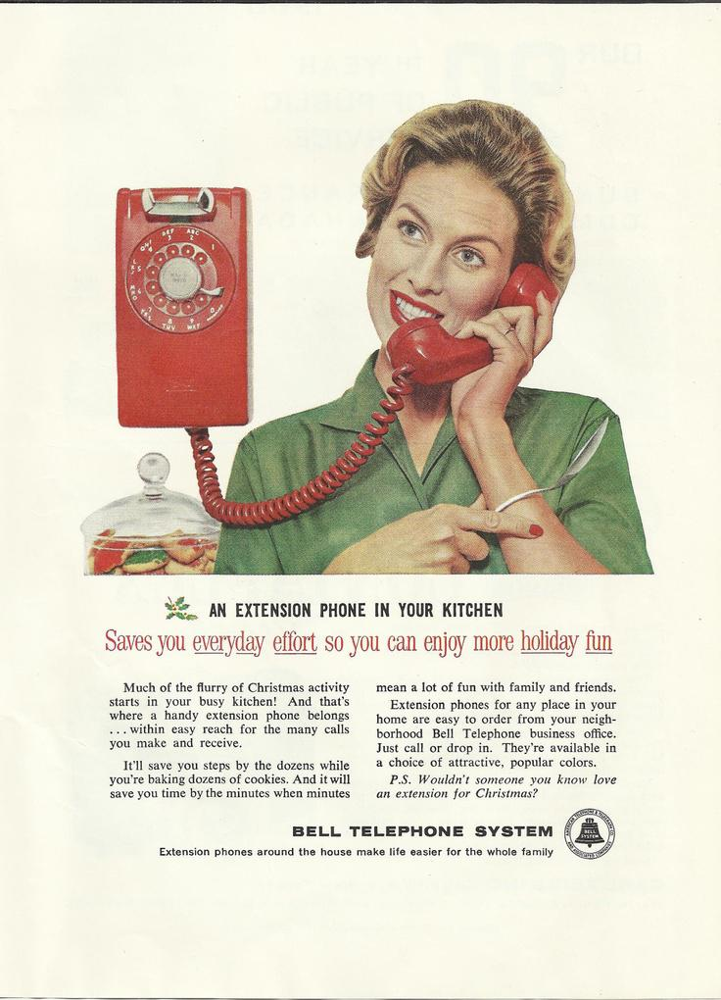

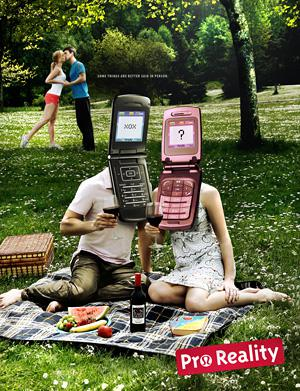

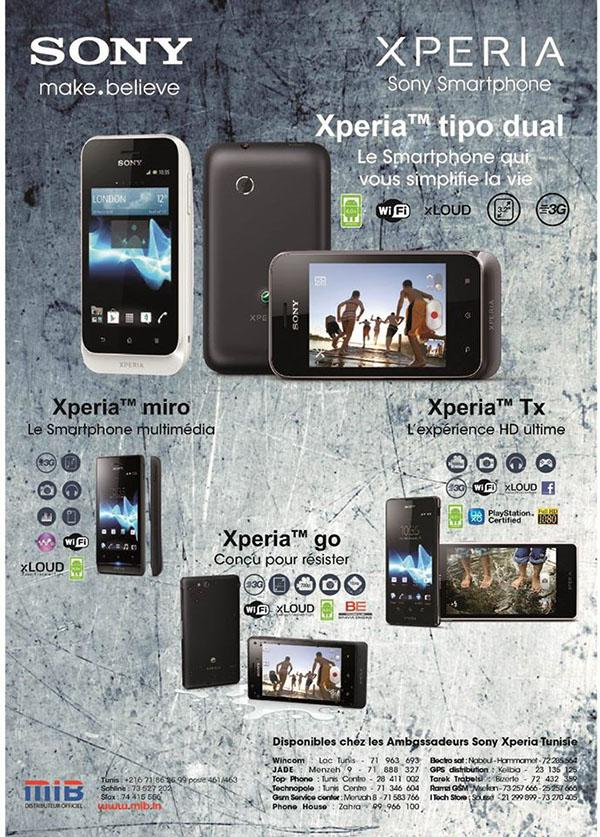

In [8]:
def query(text, limit):

    res = seaerch_client.search('demo_collection', text, limit)

    for item in res:
        img = Image.open(
            AppSettings.IMAGE_DATA_PATH + '/' + item.payload['filename']
        )

        display(img)

query('cellphone', 3)

HTTP Request: GET http://localhost:6333/collections/demo_collection "HTTP/1.1 200 OK"
HTTP Request: POST http://localhost:6333/collections/demo_collection/points/search "HTTP/1.1 200 OK"


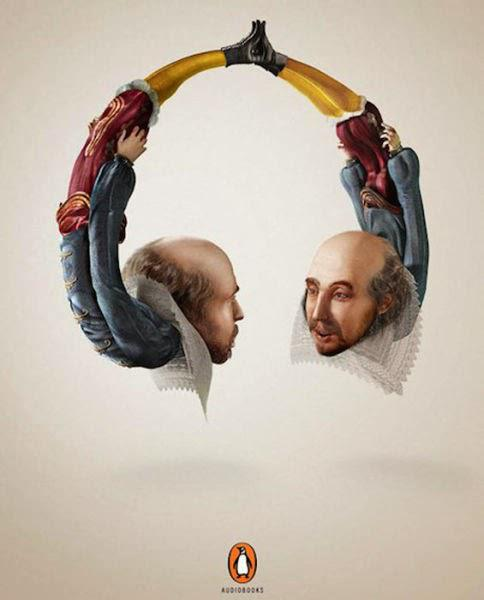

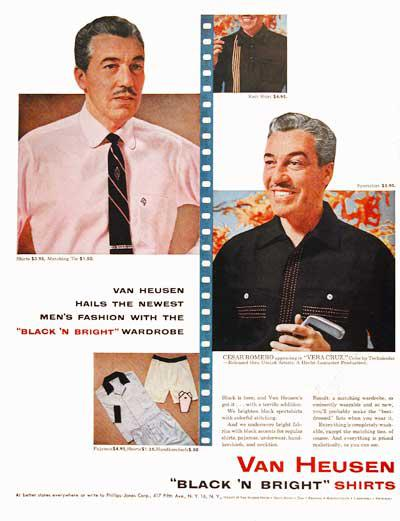

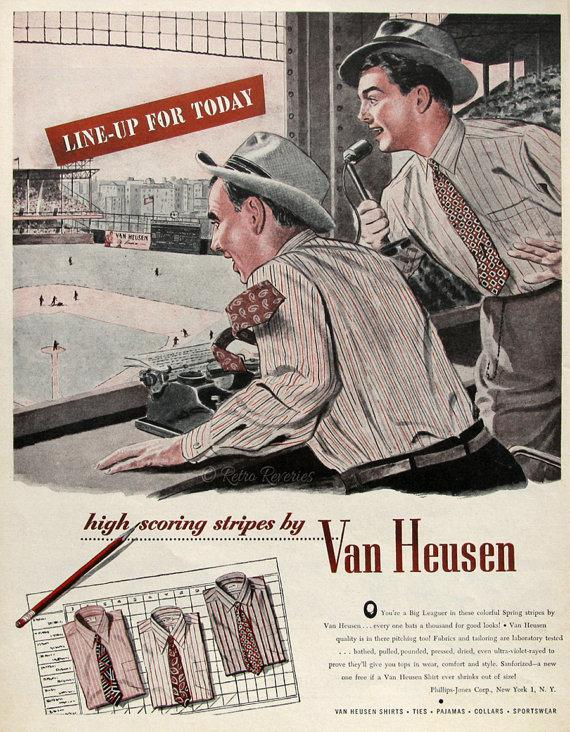

In [9]:
query('two men in talking to each other', 3)

HTTP Request: GET http://localhost:6333/collections/demo_collection "HTTP/1.1 200 OK"
HTTP Request: POST http://localhost:6333/collections/demo_collection/points/search "HTTP/1.1 200 OK"


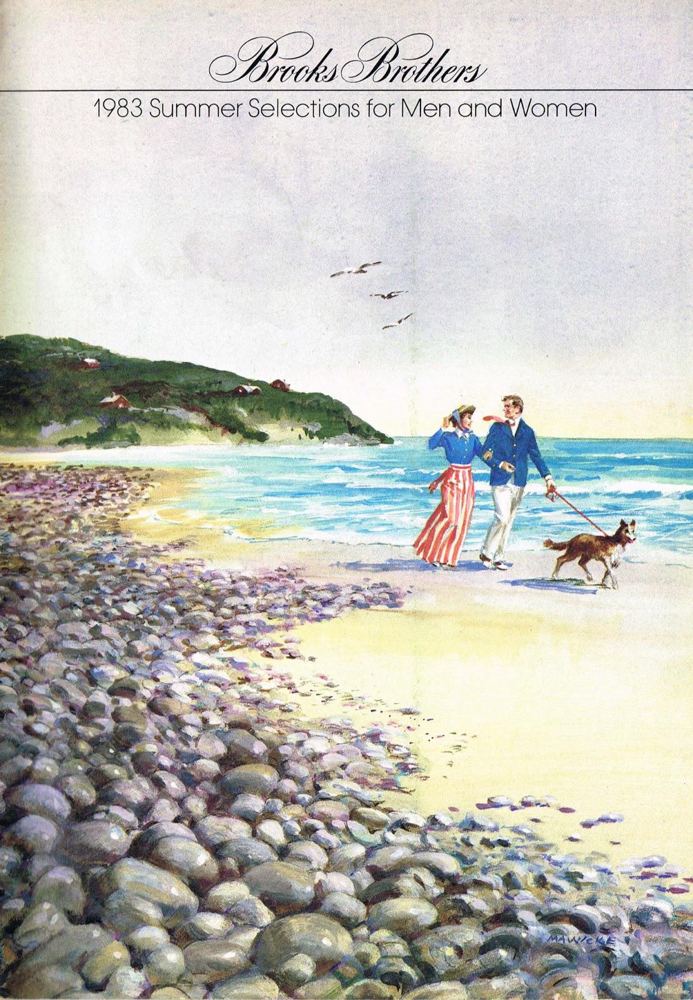

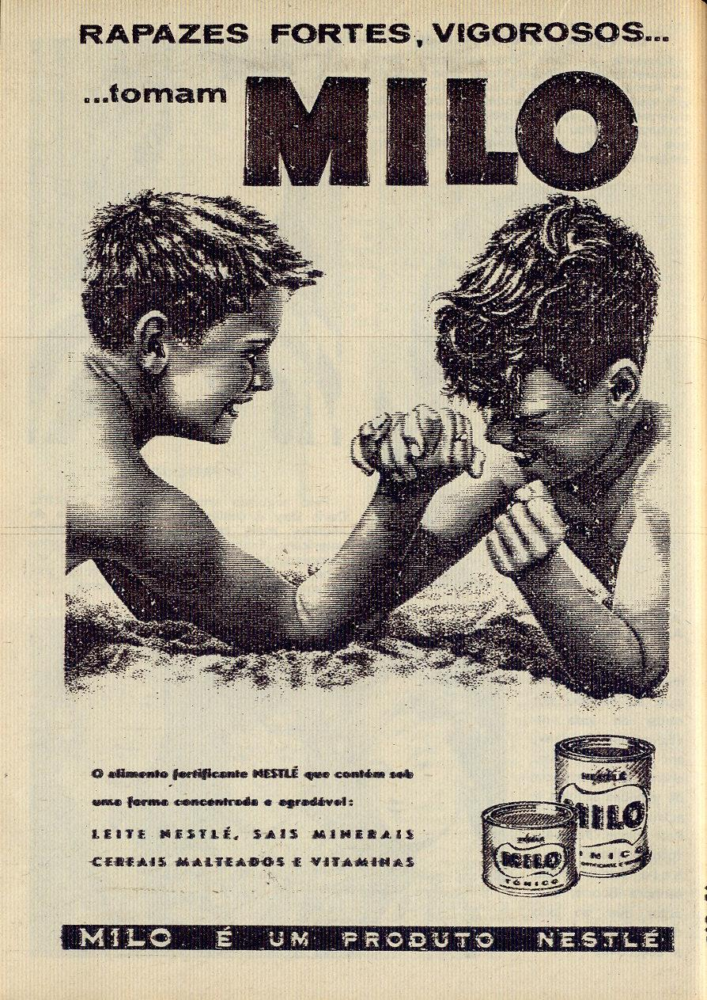

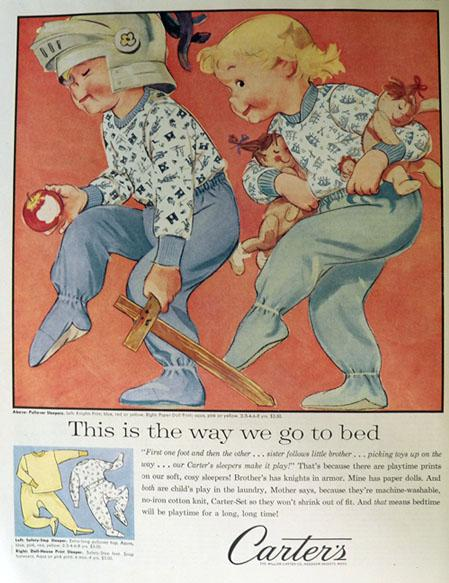

In [10]:
query('children playing in the sand', 3)

HTTP Request: GET http://localhost:6333/collections/demo_collection "HTTP/1.1 200 OK"
HTTP Request: POST http://localhost:6333/collections/demo_collection/points/search "HTTP/1.1 200 OK"


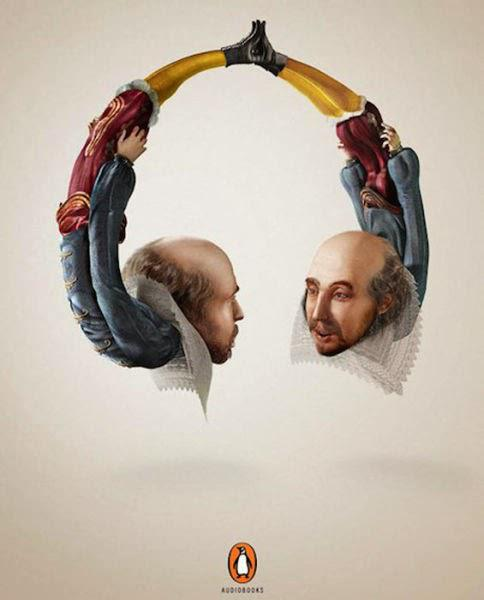

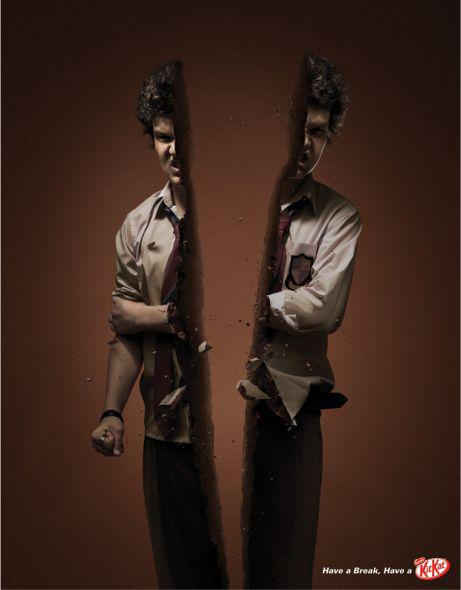

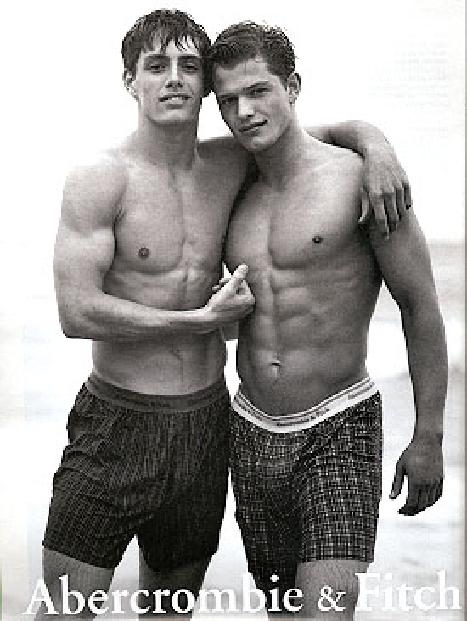

In [11]:
query('two men', 3)

### Bad Query Examples

HTTP Request: GET http://localhost:6333/collections/demo_collection "HTTP/1.1 200 OK"
HTTP Request: POST http://localhost:6333/collections/demo_collection/points/search "HTTP/1.1 200 OK"


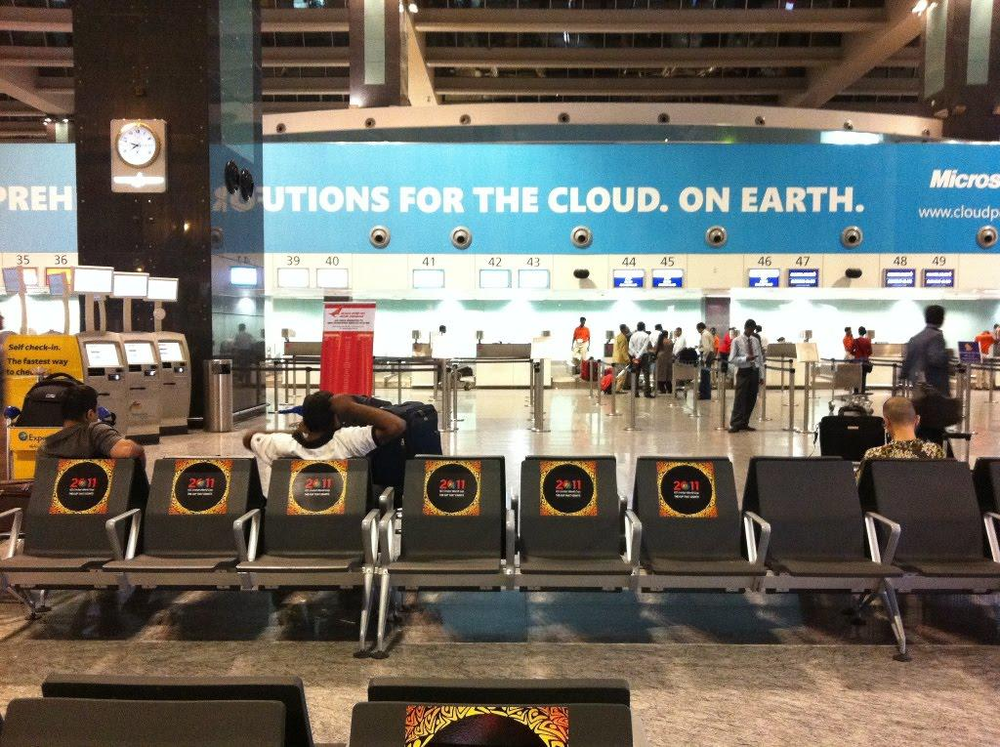

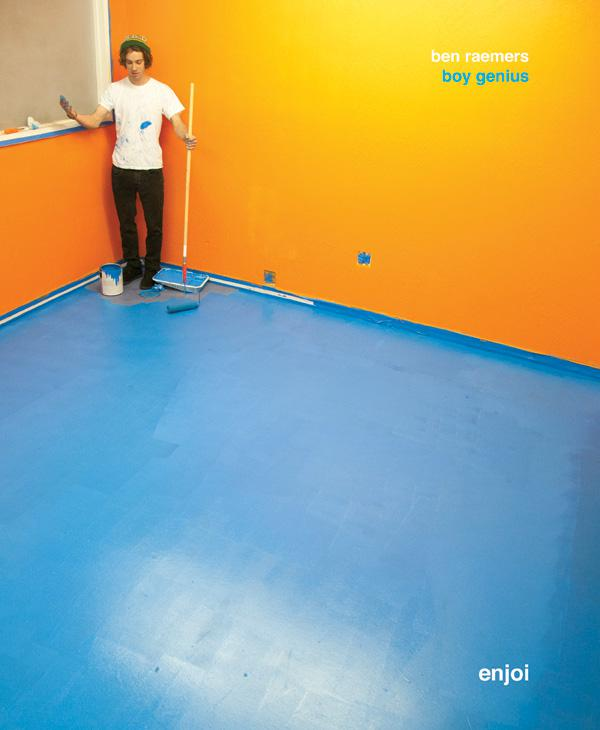

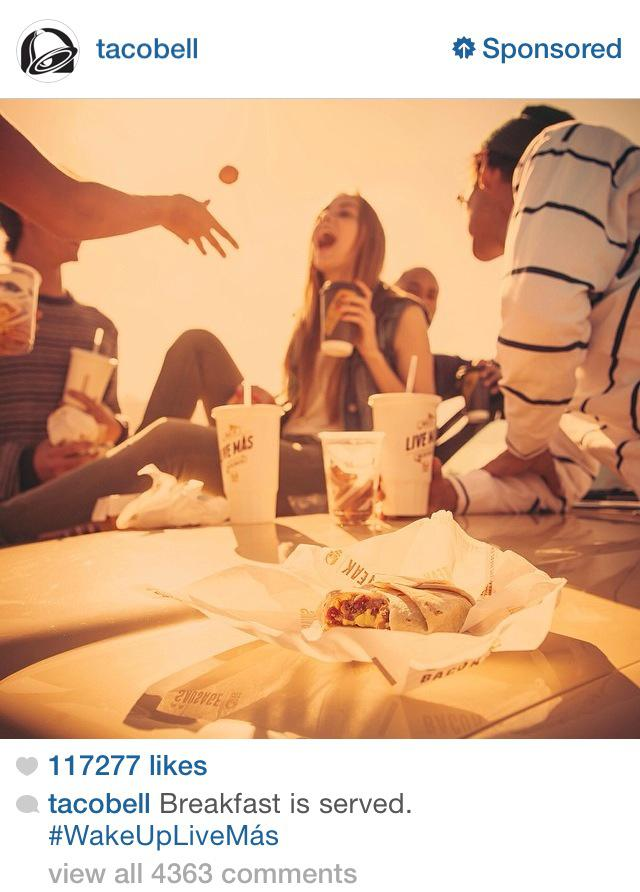

In [12]:
# here it grabs pictures but there are people in it!

query('picture with no people in it', 3)